# Homework 5

Kyle Gersbach

In [1]:
# import block
import numpy as np
from astropy.io import fits
%matplotlib inline
from matplotlib import pyplot as plt
from astropy.visualization import hist
from astropy.stats import sigma_clip
import ccdproc as ccdp
from matplotlib import rc
from datetime import datetime
from astropy.nddata import CCDData
import os
import copy
from astropy.modeling.models import Polynomial1D


phot_tutorial_dir = '/home/kyle/Homework/Astro8060/ccd-reduction-and-photometry-guide/notebooks'

import sys
sys.path.insert(0,phot_tutorial_dir)
from convenience_functions import show_image

import warnings
warnings.filterwarnings('ignore')

In [2]:
# plotting defaults
# Use custom style for larger fonts and figures
plt.style.use(phot_tutorial_dir+'/guide.mplstyle')

# Set some default parameters for the plots below
rc('font', size=12)
rc('axes', grid=True)

In [3]:
# define directories
data_dir = '/home/kyle/Homework/Astro8060/NoBackupImages/raw/'
reduced_dir = '/home/kyle/Homework/Astro8060/NoBackupImages/reduced/'

In [4]:
r0 = 0
r1 = 2048
c0 = 54
c1 = 2101

---
## Part 1 

Make sure that all your calibration images (biases, darks, flats) and science frames (all
good data for PG1633+099) are overcan, trim, and bias corrected.

---

In [5]:
bias_fileNames = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in range(93,112)]
biases = [fits.open(f) for f in bias_fileNames]

dark_fileNames = [reduced_dir+'bias&trim/d'+str(i).zfill(3)+'ot.fits' for i in range(1,16)]
darks = [fits.open(f) for f in dark_fileNames]

v_flats_fileNames = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in range(43,50)]
v_flats = [fits.open(f) for f in v_flats_fileNames]

#Science frames imported later (Memory issue)

In [6]:
#Frames need bias subtraction
masterBias = ccdp.combine(bias_fileNames,method='average',sigma_clip=True,mem_limit=350e6)

INFO: splitting each image into 10 chunks to limit memory usage to 350000000.0 bytes. [ccdproc.combiner]


### Discussion

While the files themselves are overscan subtracted and trimmed, they still need to be bias subtracted, hence the need for a master bias frame.

---
## Part 2

Examine your individual flat field images for the V filter. Are there significant artifacts? How might we combine the frames into a master flat field frame to get rid of these artifacts? Compare the average light levels in your V flats and say how this will impact
your combine strategy (hint: you will want to scale your flat field images to a common level, and then combine using some weighting to account for the fact that some flats have higher signal than others–it world be inappropriate to give them all equal weight). After scaling to a common mean, discuss the advantages and disadvantages of making a master flat field image from:
- A straight average of all V flat frames
- A straight median of all V flat frames
- An average where outlier pixels are rejected if they are more than 3σ from the mean
- An average where outlier pixels are rejected and the weighted mean is obtained by weighting each image by the mean counts in the original image. This way, bright flats field exposures with higher count rates are given more weight than flats with low light levels.

Which of these strategies, if any, is the best? Or is some combination the right approach?
Show plots and metrics like RMS to defend your conclusions.

---

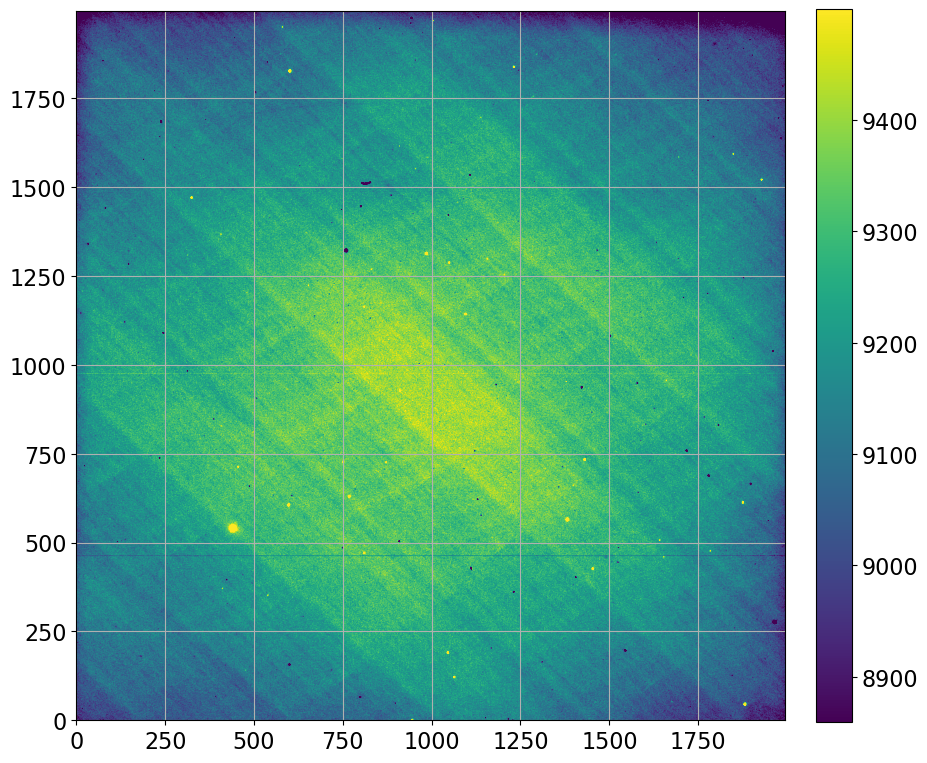

In [7]:
show_image(v_flats[0][0].data[:,54:])

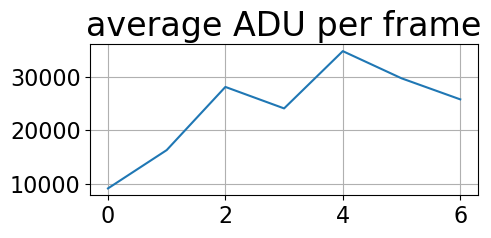

In [8]:
#Use these for weights
weights = [np.average(f[0].data[:,54:]) for f in v_flats]

plt.figure(figsize=(5,2))
plt.title('average ADU per frame')
plt.plot(weights)
plt.show()

(7, 1995, 1994)


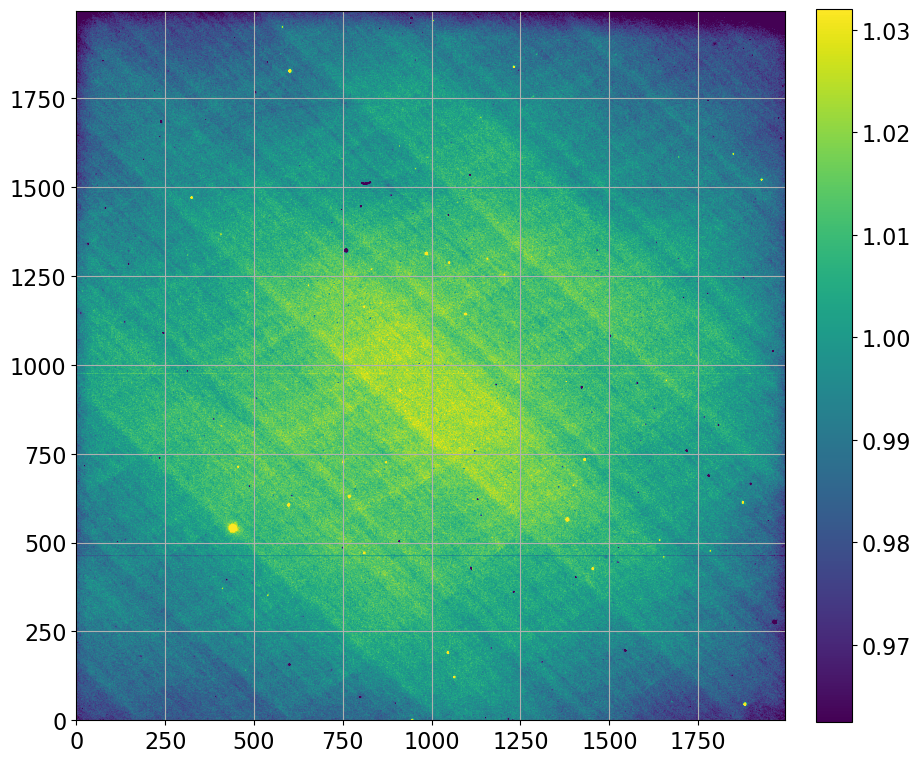

In [9]:
flatData = np.array([f[0].data[:,54:] for f in v_flats])


#get scale factors
scale = np.array([np.average(f) for f in flatData])
scales = np.ones_like(flatData)
for i in range(len(scales)):
    scales[i] = scales[i]*scale[i]

print(scales.shape)

#Scale the flats
flatData/=scales

show_image(flatData[0])

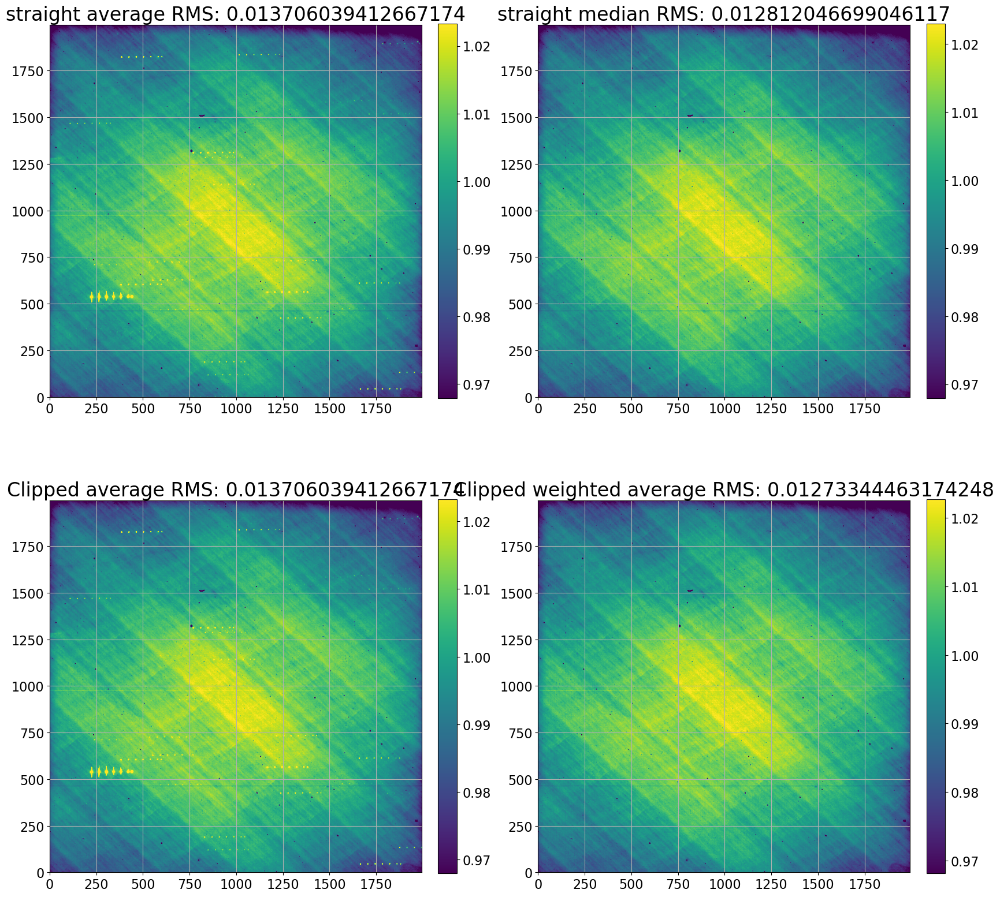

In [10]:
f, ax = plt.subplots(2,2, figsize=(20,20))

#Straight average
sAverage = np.average(flatData,axis=0)
ax[0,0].set_title('straight average RMS: {}'.format(np.std(sAverage)))
show_image(sAverage,ax=ax[0,0],fig=f)
del sAverage

#Straight median
sMedian = np.median(flatData,axis=0)
ax[0,1].set_title('straight median RMS: {}'.format(np.std(sMedian)))
show_image(sMedian,ax=ax[0,1],fig=f)
del sMedian

#Outlier regected average (3 sigma)
clipped = sigma_clip(flatData,sigma=3,axis=0,masked=True)
oAverage = np.ma.average(clipped,axis=0)
ax[1,0].set_title('Clipped average RMS: {}'.format(np.std(oAverage)))
show_image(oAverage,ax=ax[1,0],fig=f)
del oAverage
del clipped

#Outlier regected average with weight (2 sigma)
clipped = sigma_clip(flatData,sigma=2,axis=0,masked=True)
w = np.array([np.ma.mean(i) for i in clipped*scales])
owAverage = np.ma.average(clipped,axis=0,weights=w)
ax[1,1].set_title('Clipped weighted average RMS: {}'.format(np.std(owAverage)))
show_image(owAverage,ax=ax[1,1],fig=f)
plt.show()
del clipped
del w

del v_flats
del v_flats_fileNames
del flatData

### Discussion

The significant artifacts in the flat field images are due to stars that appear brighter than the sky (since these are sky flats). To get rid of these you either need to do sigma clipping or some other strategy like a median to remove them. However, because the average level of the frames drops over time (between frames), taking a median will just return the middle frame. To combat both issues at the sametime, taking a weighted average with sigma clipping is ideal. The weighting will allow the average to sway towards more accurate and higher readings of the flat fields. Similarly, sigma clipping will remove most stars, though sigma clipping needs either a large number of samples, or a lower threshold of sigma. Becuase we only have 7 samples, lower sigmas are needed to remove all stars.

As shown in the plots and titles above, the method with the lowest RMS while also getting rid of all of the stars was outlier rejection and weighted averaging.

---
## Part 3
Combine your flat field images to make a master flat for all filters using the strategy that you arrived at above

---

In [11]:
#Best method is clipping with weighted average

#LIMIT FILES TO ONLY FIRST 8 GOOD ONES (Memory Limit)
#halpha_files = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in list(range(5,15))] 
u_files = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in list(range(21,29))]
b_files = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in list(range(29,37))]
v_files = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in range(43,50)]
r_files = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in list(range(50,55))]
i_files = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in list(range(57,63))]

key = ['u','b','v','r','i']
allFiles = [u_files,b_files,v_files,r_files,i_files]
masterFlat = []
for i in range(len(key)):
    print('Working on: ',key[i])
    fNames = allFiles[i]
    fData = np.array([fits.open(f)[0].data[:,54:] for f in fNames])

    #get scale factors
    scale = np.array([np.average(f) for f in fData])
    scales = np.ones_like(fData)
    for i in range(len(scales)):
        scales[i] = scales[i]*scale[i]

    #Scale the flats
    fData/=scales
    
    
    #Outlier regected average with weight (2 sigma)
    clipped = sigma_clip(fData,sigma=2,axis=0,masked=True)
    w = np.array([np.ma.mean(i) for i in clipped*scales])
    wAverage = np.ma.average(clipped,axis=0,weights=w)
    
    masterFlat.append(wAverage)

Working on:  u
Working on:  b
Working on:  v
Working on:  r
Working on:  i


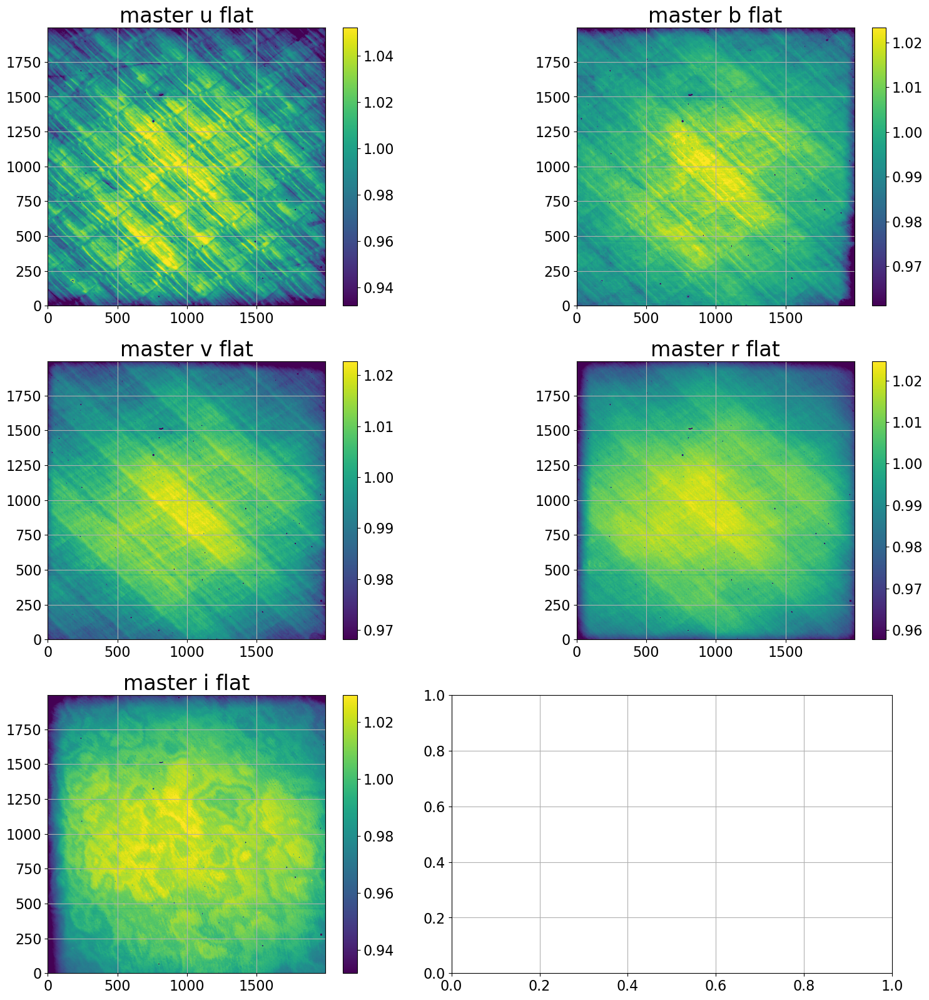

In [12]:
f, ax = plt.subplots(3,2, figsize=(20,20))
ax[0,0].set_title('master u flat')
show_image(masterFlat[0],ax=ax[0,0],fig=f)
ax[0,1].set_title('master b flat')
show_image(masterFlat[1],ax=ax[0,1],fig=f)
ax[1,0].set_title('master v flat')
show_image(masterFlat[2],ax=ax[1,0],fig=f)
ax[1,1].set_title('master r flat')
show_image(masterFlat[3],ax=ax[1,1],fig=f)
ax[2,0].set_title('master i flat')
show_image(masterFlat[4],ax=ax[2,0],fig=f)
plt.show()

### Discussion

While I don't entirely know what is happening with the different filters giving different patterns, I can imagine that this has something to do with the make-up/imperfections on the surfaces. Because filters are made differently and with different materials, the flat frames will look different

---
## Part 4

Normalize your master flat field image for each filter so that it has a mean of 1 (i.e., find the mean in the image and divide by that mean) This way, when you divide your images by your master flat field image, you don’t lose track of your photon statistics.

---

In [13]:
for i in range(len(masterFlat)):
    masterFlat[i] = masterFlat[i]/np.average(masterFlat[i])

print([np.average(f) for f in masterFlat])

[1.0000000000000013, 0.999999999999999, 1.0000000000000004, 1.0000000000000002, 0.9999999999999997]


### Discussion

It sorta seems they were already normalized? Did I do a step wrong?

---
## Part 5

Divide your science frames by your normalized flat field

---

In [14]:
#Log shows files that aren't there! (a221.fits - a236.fits)

s_uframe_nums = [81,82,130,131,202,203,237,238]
s_uNames = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in s_uframe_nums]

s_bframe_nums = [83,84,132,133,204,205,239,240]
s_bNames = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in s_bframe_nums]

s_vframe_nums = [85,86,134,135,206,207,241,242]
s_vNames = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in s_vframe_nums]

s_rframe_nums = [87,88,136,137,208,209,239,240]
s_rNames = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in s_rframe_nums]

s_iframe_nums = [89,90,138,139,210,211,245,246]
s_iNames = [reduced_dir+'bias&trim/a'+str(i).zfill(3)+'ot.fits' for i in s_iframe_nums]

scienceNames = [s_uNames,s_vNames,s_bNames,s_rNames,s_iNames]

#sciences = [[fits.open(f)[0].data[:,54:]-masterBias[:,54:] for f in names] for names in scienceNames]

In [ ]:
#NOTE: I can't run this cell! Too much memory for this poor laptop
#It should work however, I checked subsections of the loops.

sciences = []

# For each filter
for i in range(len(scienceNames)):
    imgs = []
    
    #For each name in that filter
    for name in scienceNames[i]:
        d = fits.open(name)[0].data
        
        #Remove bias
        d = d-masterBias
        
        #Get good data
        d = d[:,54:]
        
        #Divide by flats in that filter
        imgs.append(d/masterFlat[i])
        
    sciences.append(imgs)

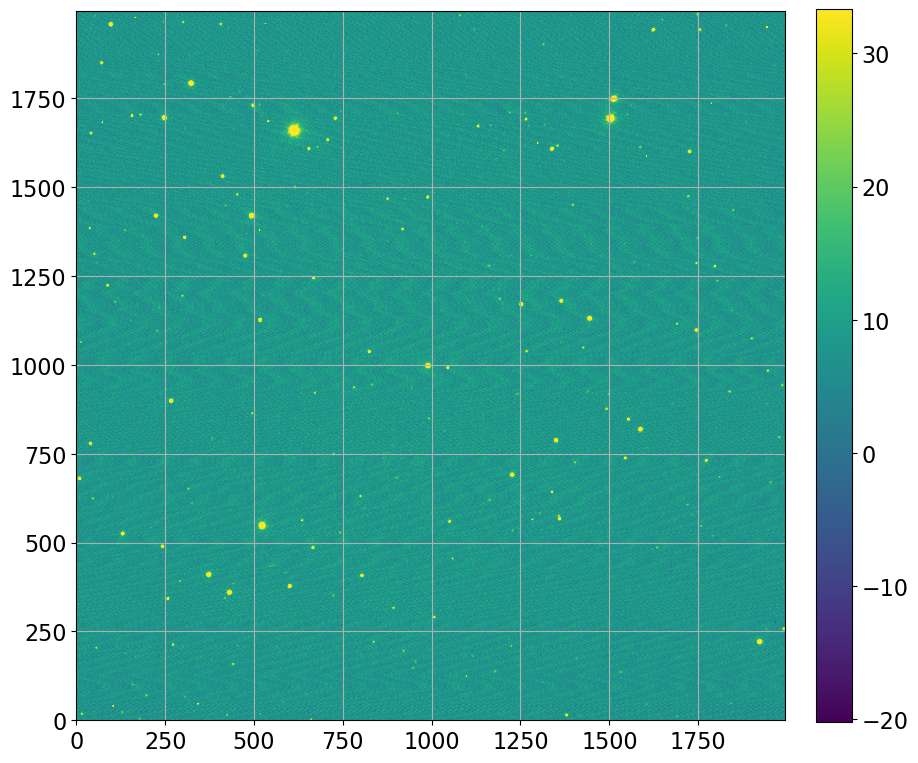

In [15]:
d = fits.open(scienceNames[0][0])[0].data
d = d-masterBias
d = d[:,54:]
show_image(d)

### Discussion

I unfortunately am running into more memory problems on my laptop :(

While I can't run the full analysis cell above, I was able to run parts of it to confirm it works as intended (as shown above). In this step, I had to remove the bias from the science frames, as previously, I only had done the overscan subtraction and trim.

---
## Part 6

Compute the gain and read noise for this CCD using a couple of the flat field images and bias images, as described in Howell’s Handbook of CCD Astronomy and in class notes. Decide, by examination, what sections of each image you should use to determine these values (using the whole frame is probably not a good idea, why?). NOTE: The flat-field images, F, that are used for this procedure should already be flat-fielded using a normalized master flat. Otherwise, the sigma term will contain contributions both from Poisson noise AND from pixel-to-pixel sensitivity fluctuations, and be too large, leading to an unrealistically small gain.

---

EQs: 

$G=\frac{(F_1-F_2)-(B_1-B_2)}{\sigma^2_{F1-F2} -\sigma^2_{B1-B2}} $

&

$RN = \frac{G*\sigma_{B1-B2}}{\sqrt{2}}$

In [16]:
mid = int(1994/2)
delta = 50

flat1 = fits.open(reduced_dir+'bias&trim/a047ot.fits')[0].data[mid-delta:mid+delta,mid-delta:mid+delta]
flat2 = fits.open(reduced_dir+'bias&trim/a048ot.fits')[0].data[mid-delta:mid+delta,mid-delta:mid+delta]

#Flat field the flats
flat1/=masterFlat[2][mid-delta:mid+delta,mid-delta:mid+delta]
flat2/=masterFlat[2][mid-delta:mid+delta,mid-delta:mid+delta]

flatDif = flat1-flat2
flatstd = np.std(flatDif)

bias1 = fits.open(reduced_dir+'bias&trim/a093ot.fits')[0].data[mid-delta:mid+delta,mid-delta:mid+delta]
bias2 = fits.open(reduced_dir+'bias&trim/a094ot.fits')[0].data[mid-delta:mid+delta,mid-delta:mid+delta]

biasDif = bias1-bias2
biasstd = np.std(biasDif)

In [17]:
gain = ((np.average(flat1)-np.average(flat2))-(np.average(bias1)-np.average(bias2)))/(flatstd**2 - biasstd**2)
print('Calculated a gain of:',gain)

readNoise = gain*biasstd/(np.sqrt(2))
print('Calculated a read noise of:',readNoise)

Calculated a gain of: 0.12860111796037085
Calculated a read noise of: 1.1361618892879306


### Discussion

While I don't know if these numbers are even resonable, I did follow the "Handbook of CCD Astronomy" to create them. Specifically page 72 and 73 deal with the equations listed in the top of this section.

In regards to the question of where to read the image for this, it is best to do it near the center of the sensor, as you want to get away from any fringe effects. In my case, I just used the center 100x100 square of pixels in each image